# Vignette: Model Comparison Dashboard

This notebook serves as a presentation dashboard for the direct evaluation of the Mark 3 dataset (`v2_2_full`). It programmatically loads, arranges, and displays the pre-computed output visualisations generated by the B-MTGNN and VisionTS++ model pipelines.

The visualisations are structured across four evaluation areas:
1. Updated dataset specifications (`v2_2_full` with 1,231 feature channels and 144 monthly steps)
2. 36-month forecast horizon (January 2026 to December 2028)
3. Model validation figures (Figure 3: Actual vs Predicted)
4. Comparative metrics and continuous trends (Table 9 and Figure 4 with symmetric alpha smoothing of 0.05)

No training loops or data transformation scripts are executed in this notebook. It reads the generated `.png` image artifacts directly from the configuration paths.

In [1]:
# Cell 1: Environment Setup & Library Imports
import sys
from pathlib import Path

# Append project root to sys.path
notebook_dir = Path.cwd()
project_root = notebook_dir.parent
if str(project_root) not in sys.path:
    sys.path.append(str(project_root))

# Import centralised paths
from Config.Paths import (
    BMTGNN_FORECAST_DIR,
    BMTGNN_GAPS_DIR,
    BMTGNN_GLOBAL_DIR,
    BMTGNN_OUTLOOK_DIR,
    VISION_FORECAST_DIR,
    VISION_GAPS_DIR,
    VISION_GLOBAL_DIR,
    VISION_OUTLOOK_DIR,
    COMPARISON_PLOTS_DIR,
    TABLE_9_IMG
)

# Import layout utilities from local helper script
from Dashboard_Utils import display_single_image, display_image_grid, display_side_by_side

print("Environment setup complete. Dashboard utilities imported.")

Environment setup complete. Dashboard utilities imported.


## Overall Model Evaluation Summary

This section presents the evaluation metrics comparing the B-MTGNN and VisionTS++ models over the 36-month test period. To prevent distortion from sparse background variables, the evaluation is restricted to the 26 primary target threat vectors. Relative Squared Error (RSE) and Relative Absolute Error (RAE) are calculated using a micro-averaged multivariate approach, summing the squared errors and variance across all 26 targets simultaneously.

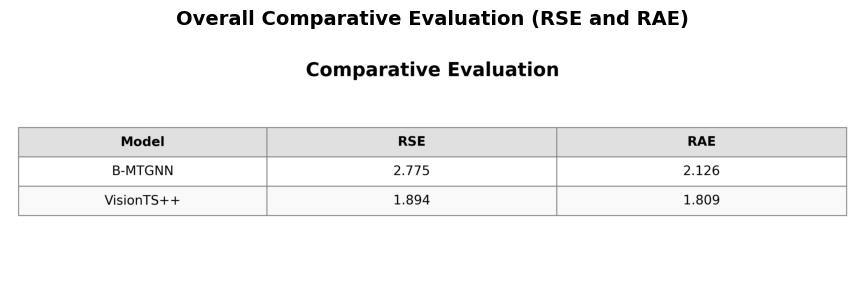

In [2]:
display_single_image(
    img_path=str(TABLE_9_IMG),
    title="Overall Comparative Evaluation (RSE and RAE)",
    figsize=(14, 3),
)


## Section 1: Global Evaluation Metrics

This section displays the overall performance metrics calculated against the test set for both models. The tables capture the Relative Squared Error (RSE), Relative Absolute Error (RAE), Mean Absolute Error (MAE), Root Mean Squared Error (RMSE), Mean Absolute Percentage Error (MAPE), and Empirical Correlation Coefficient (CORR) across the 12-month, 24-month, and 36-month forecasting horizons.

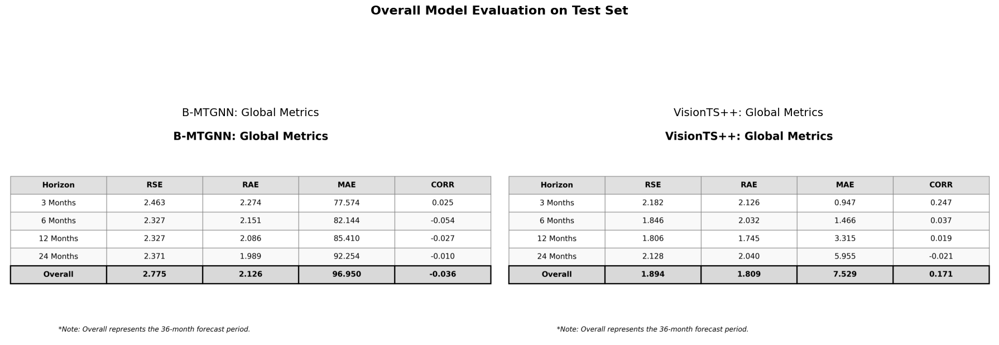

In [3]:
# Cell 2: Global Evaluation Metrics (Table 9)
bmtgnn_eval_img = BMTGNN_GLOBAL_DIR / "BMTGNN_Eval_Table.png"
vision_eval_img = VISION_GLOBAL_DIR / "Vision_Eval_Table.png"

display_side_by_side(
    img_path_left=str(bmtgnn_eval_img),
    img_path_right=str(vision_eval_img),
    title_left="B-MTGNN: Global Metrics",
    title_right="VisionTS++: Global Metrics",
    main_title="Overall Model Evaluation on Test Set",
)

## Section 2: Gap Analysis – Top Widening Risks

The gap analysis identifies cyber threats where attack volume is projected to grow faster than defensive capabilities. This visualisation highlights the overall widening risk gaps over the 36-month forecasting horizon (Table 5).

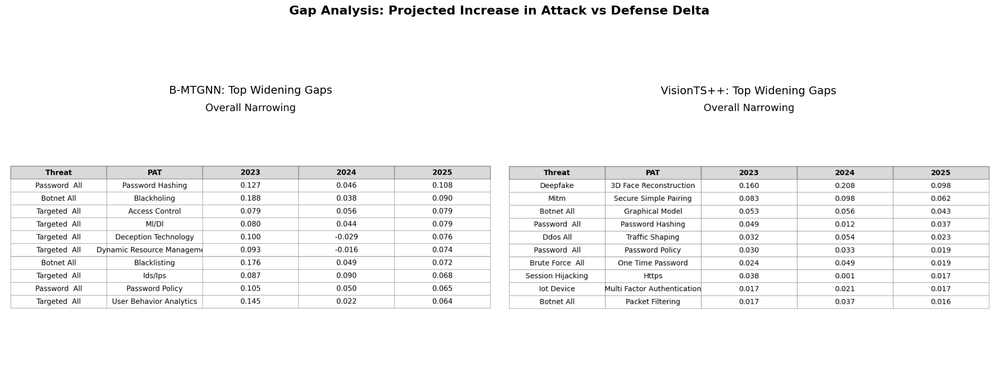

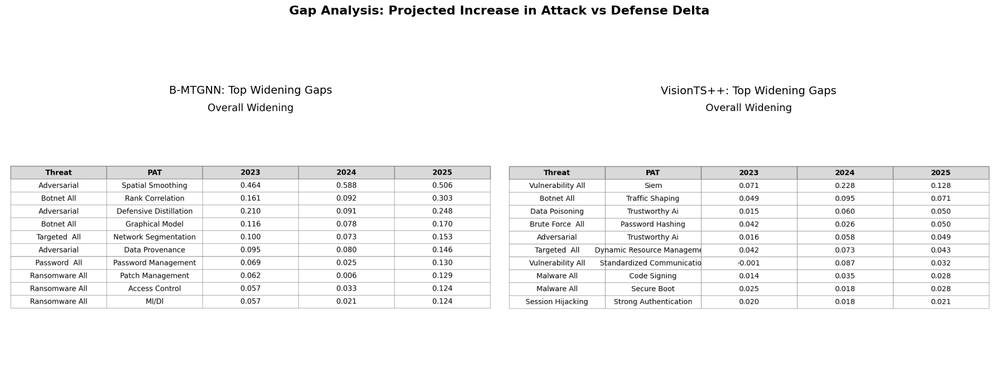

In [ ]:
# Cell 3: Gap Analysis – Widening Risks (Table 5)

bmtgnn_widening_img = BMTGNN_GAPS_DIR / "Overall_Narrowing.png"
vision_widening_img = VISION_GAPS_DIR / "Overall_Narrowing.png"

display_side_by_side(
    img_path_left=str(bmtgnn_widening_img),
    img_path_right=str(vision_widening_img),
    title_left="B-MTGNN: Top Widening Gaps",
    title_right="VisionTS++: Top Widening Gaps",
    main_title="Gap Analysis: Projected Increase in Attack vs Defense Delta",
)

bmtgnn_widening_img = BMTGNN_GAPS_DIR / "Overall_Widening.png"
vision_widening_img = VISION_GAPS_DIR / "Overall_Widening.png"


display_side_by_side(
    img_path_left=str(bmtgnn_widening_img),
    img_path_right=str(vision_widening_img),
    title_left="B-MTGNN: Top Widening Gaps",
    title_right="VisionTS++: Top Widening Gaps",
    main_title="Gap Analysis: Projected Increase in Attack vs Defense Delta",
)

## Section 3: Gap Analysis – Narrowing Risks

This section details cyber threats where defensive measures are matching or outpacing attack growth. It is divided into two visualisations:
* **Strictly Narrowing Gaps:** Threat vectors where attack volume decreases while defensive capabilities remain constant or improve.
* **Overall Narrowing Gaps:** Threat vectors where defensive capabilities expand faster than attack growth over the 36-month period (Table 6).

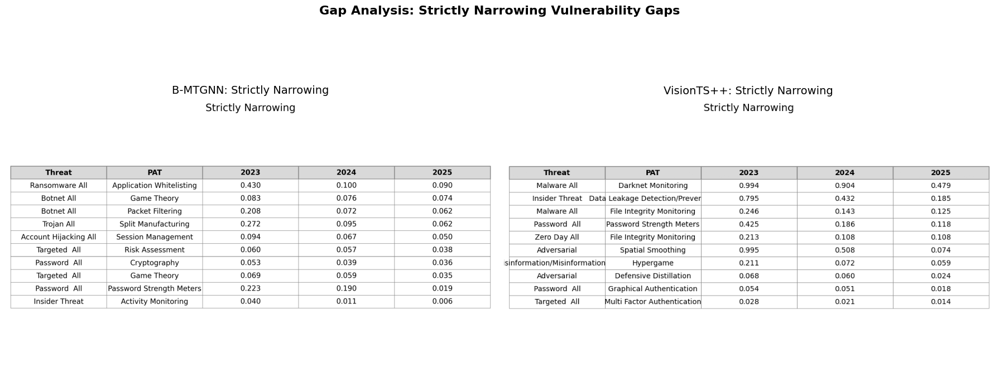

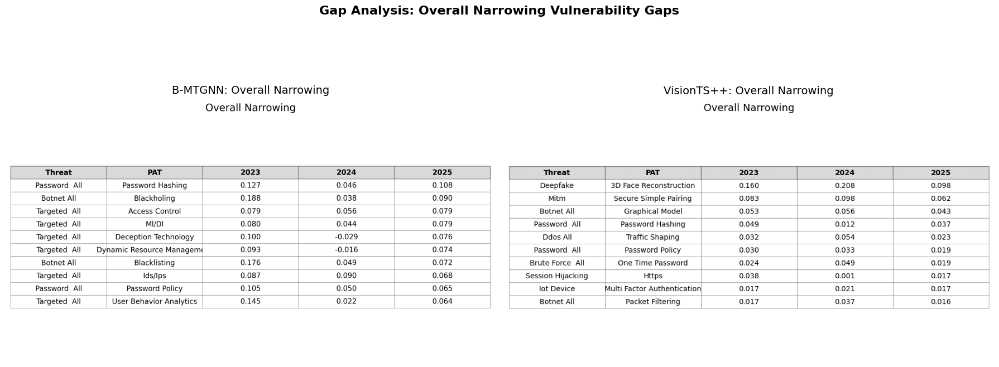

In [ ]:
# Cell 4: Gap Analysis – Narrowing Risks (Table 6)
bmtgnn_strictly_img = BMTGNN_GAPS_DIR / "Strictly_Narrowing.png"
vision_strictly_img = VISION_GAPS_DIR / "Strictly_Narrowing.png"

display_side_by_side(
    img_path_left=str(bmtgnn_strictly_img),
    img_path_right=str(vision_strictly_img),
    title_left="B-MTGNN: Strictly Narrowing",
    title_right="VisionTS++: Strictly Narrowing",
    main_title="Gap Analysis: Strictly Narrowing Vulnerability Gaps",
)

bmtgnn_overall_narrow_img = BMTGNN_GAPS_DIR / "Overall_Narrowing.png"
vision_overall_narrow_img = VISION_GAPS_DIR / "Overall_Narrowing.png"

display_side_by_side(
    img_path_left=str(bmtgnn_overall_narrow_img),
    img_path_right=str(vision_overall_narrow_img),
    title_left="B-MTGNN: Overall Narrowing",
    title_right="VisionTS++: Overall Narrowing",
    main_title="Gap Analysis: Overall Narrowing Vulnerability Gaps",
)

## Section 4: Forecast Accuracy (Shared Features)

This section provides a node-by-node breakdown of the 36-month forecast accuracy, comparing the model predictions directly against the historical data and the ground truth. 

To ensure an exact comparison, this grid strictly displays the 11 threat vectors that overlap between the B-MTGNN architecture and the VisionTS++ architecture. The remaining 15 features exclusive to the B-MTGNN model are visualised in the subsequent section.

*Note: Visualisations missing from the local directory will render as pending placeholders until the batch generation scripts are executed.*

--- Rendering Figure 3 Validation Plots (26 Target Threats) ---


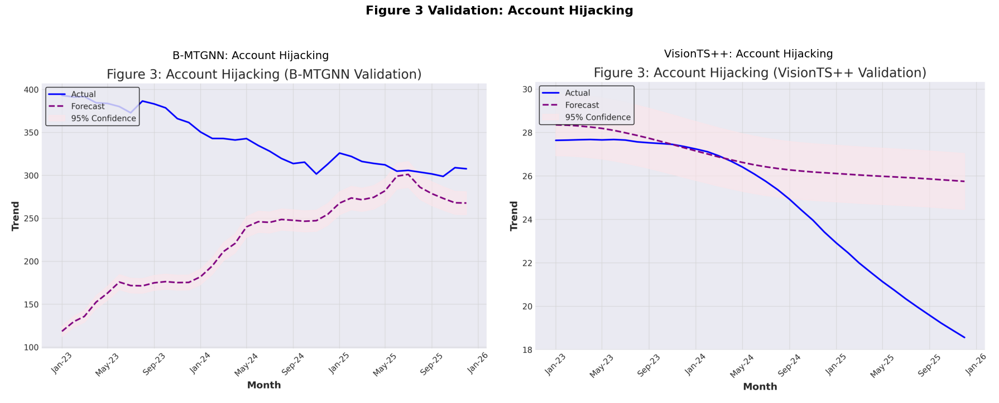

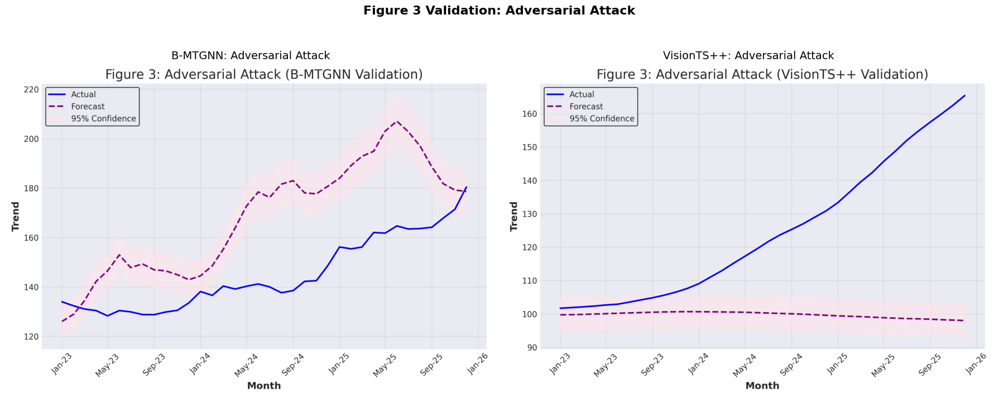

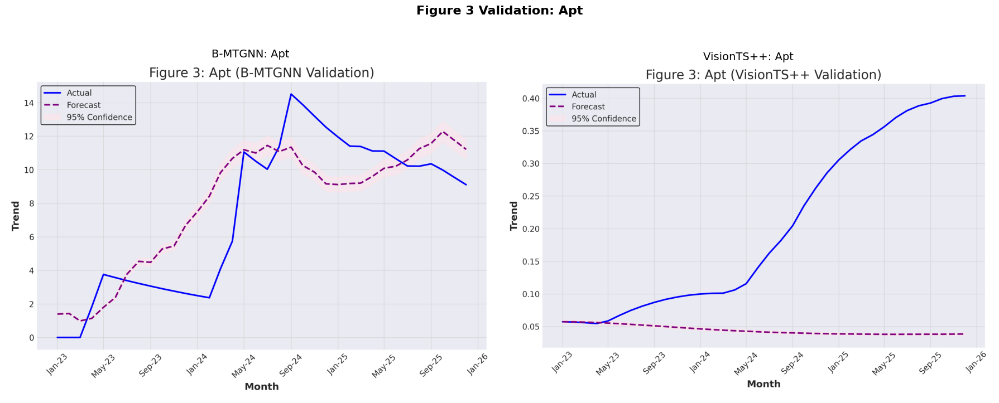

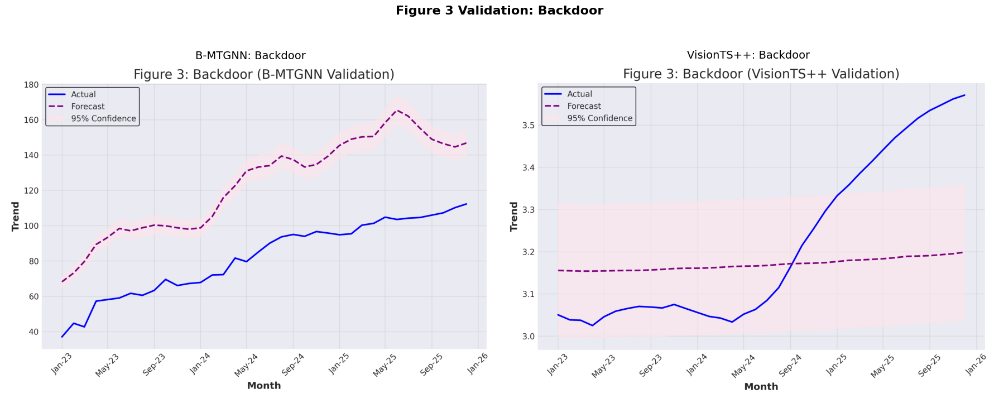

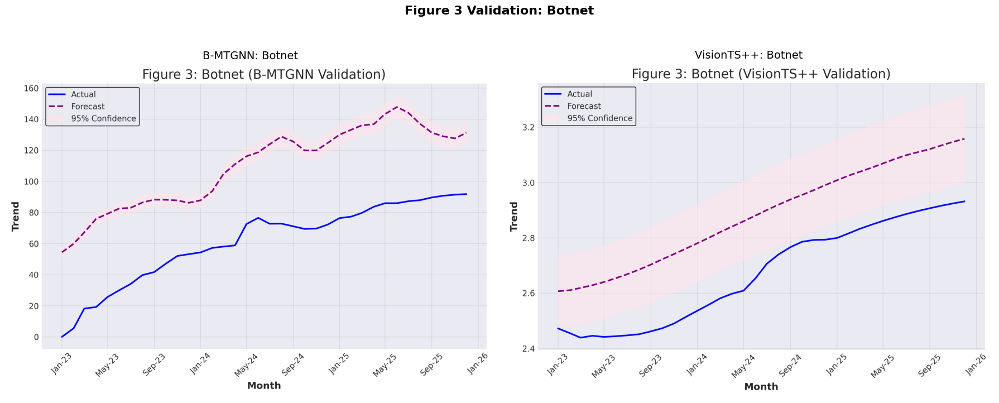

...

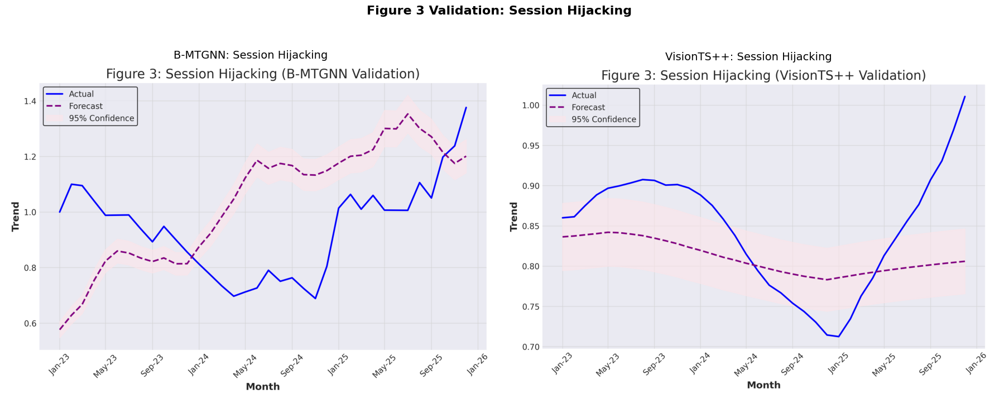

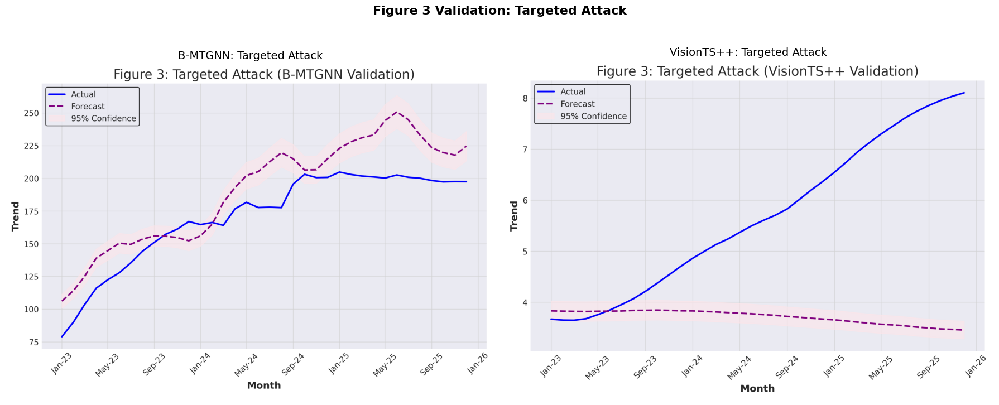

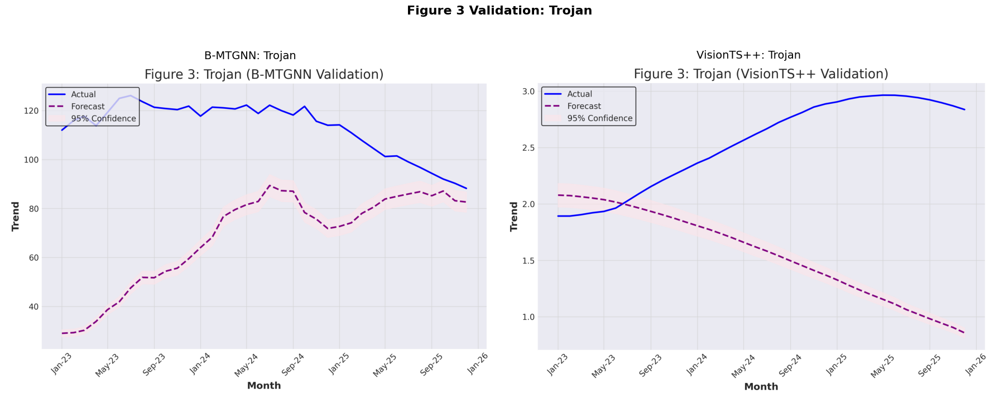

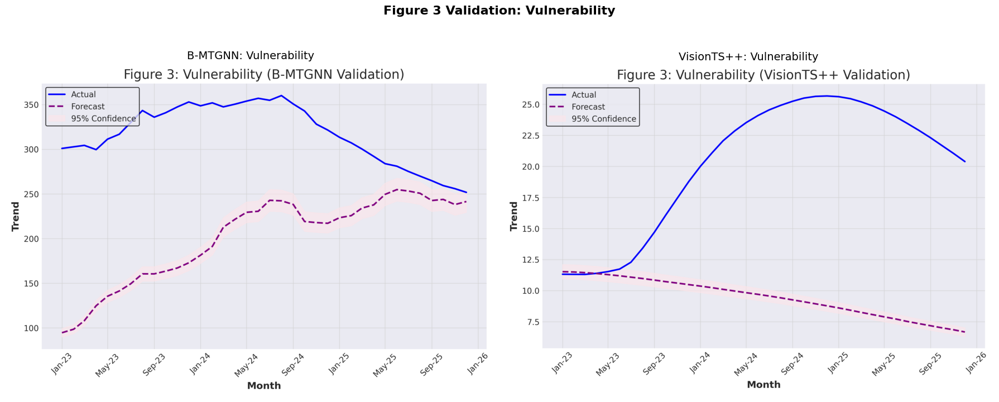

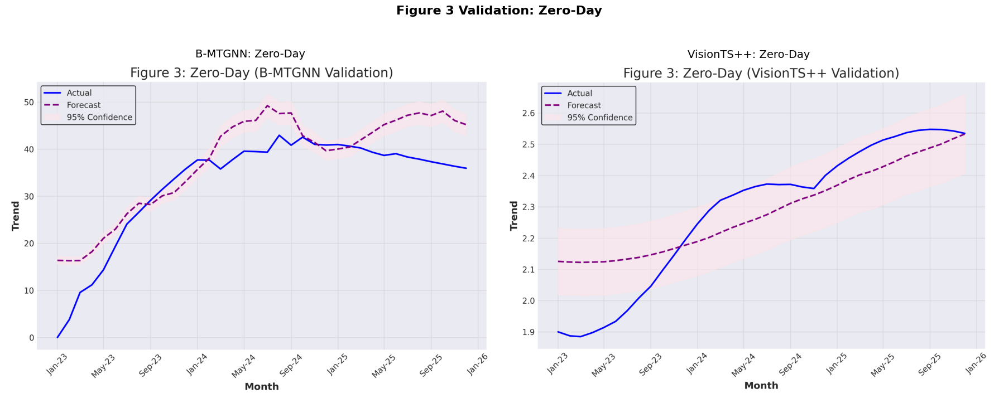

In [4]:
# Complete list of 26 target threat vectors in the dataset
target_threats = [
    "Account_Hijacking",
    "Adversarial_Attack",
    "Apt",
    "Backdoor",
    "Botnet",
    "Brute_Force_Attack",
    "Cryptojacking",
    "Data_Poisoning",
    "Ddos",
    "Deepfake",
    "Disinformation",
    "Dns_Spoofing",
    "Dropper",
    "Insider_Threat",
    "Iot_Device_Attack",
    "Malware",
    "Mitm",
    "Password_Attack",
    "Phishing",
    "Ransomware",
    "Session_Hijacking",
    "Targeted_Attack",
    "Trojan",
    "Vulnerability",
    "Zero-Day",
]

print("--- Rendering Figure 3 Validation Plots (26 Target Threats) ---")

for threat in target_threats:
    bmtgnn_fig3_path = BMTGNN_FORECAST_DIR / f"Fig3_{threat}.png"
    vision_fig3_path = VISION_FORECAST_DIR / f"Fig3_{threat}.png"

    display_name = threat.replace("_", " ")

    display_side_by_side(
        img_path_left=str(bmtgnn_fig3_path),
        img_path_right=str(vision_fig3_path),
        title_left=f"B-MTGNN: {display_name}",
        title_right=f"VisionTS++: {display_name}",
        main_title=f"Figure 3 Validation: {display_name}",
    )

## Section 5: Continuous Trends Outlook (Figure 4)

This section presents the 36-month continuous trend forecasts (2026 to 2028) for cyber threat vectors alongside their associated mitigation technologies (PATs). Both model outputs apply a calibrated alpha smoothing baseline of 0.05 to preserve trajectory dynamics while dampening high-frequency noise.

--- Rendering Figure 4 Continuous Trend Outlook (Alpha = 0.05 Baseline) ---


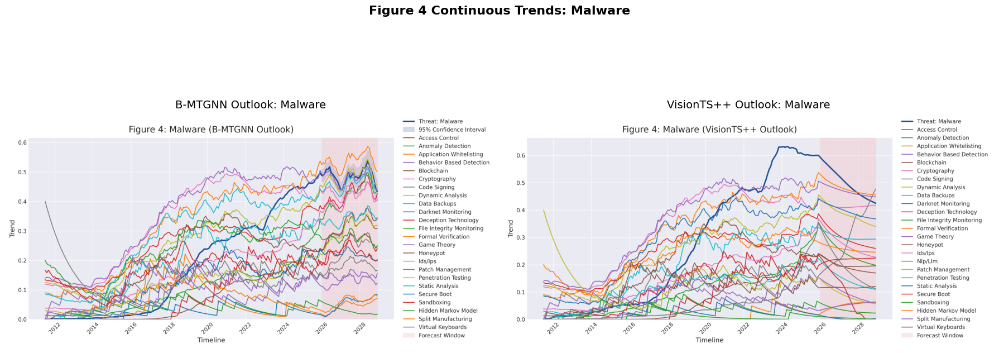

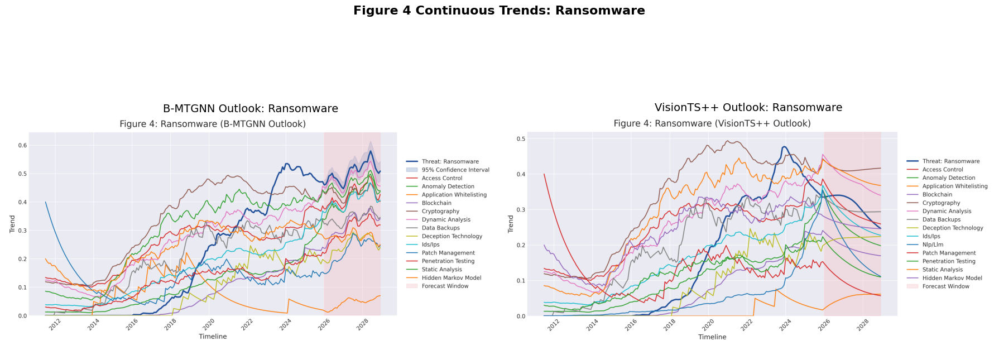

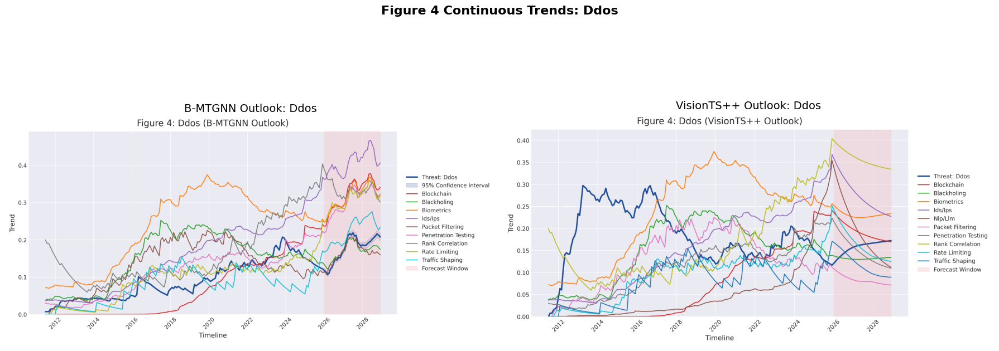

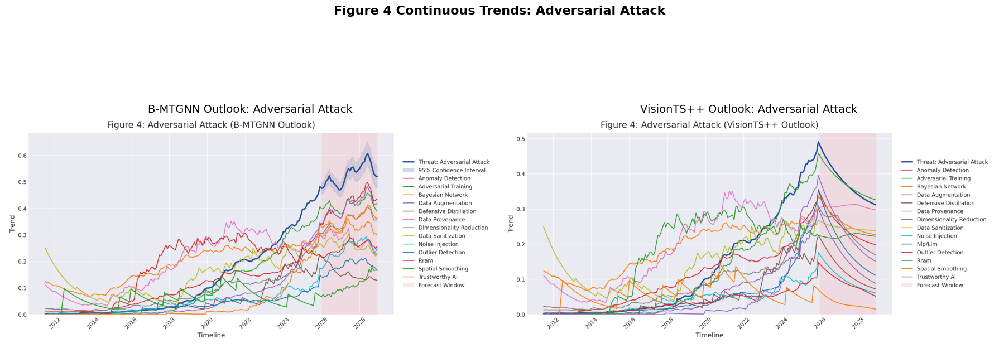

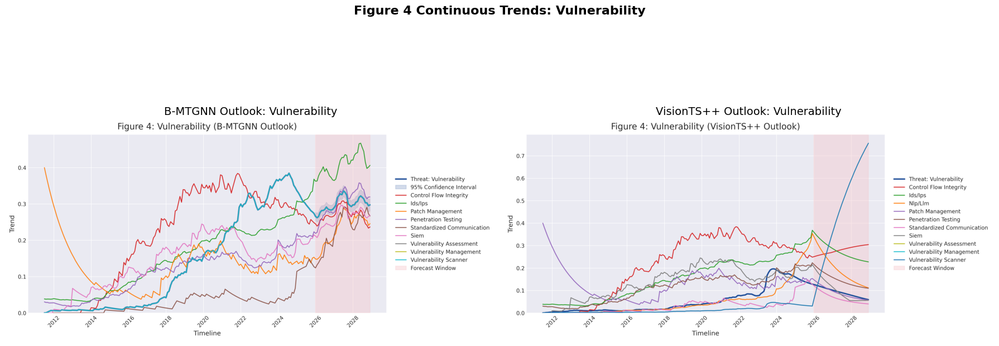

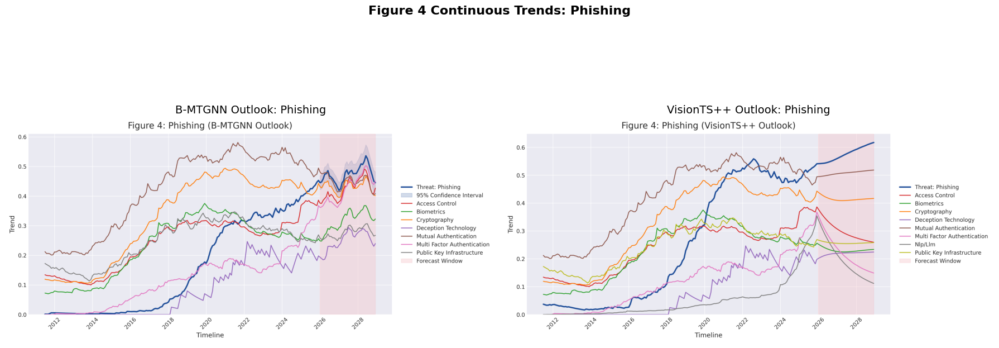

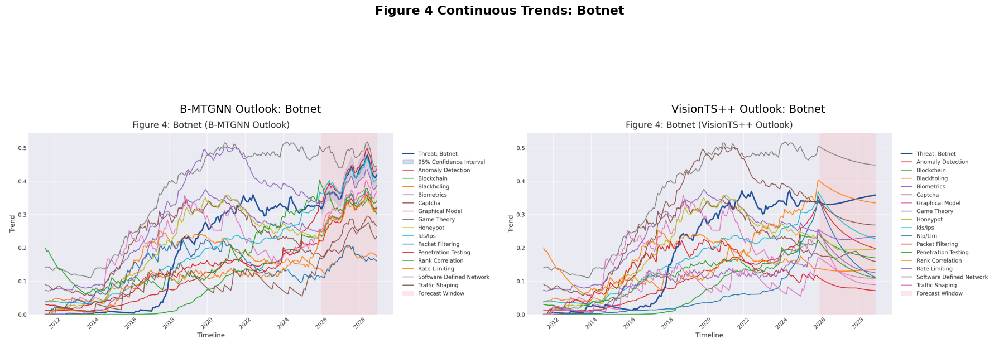

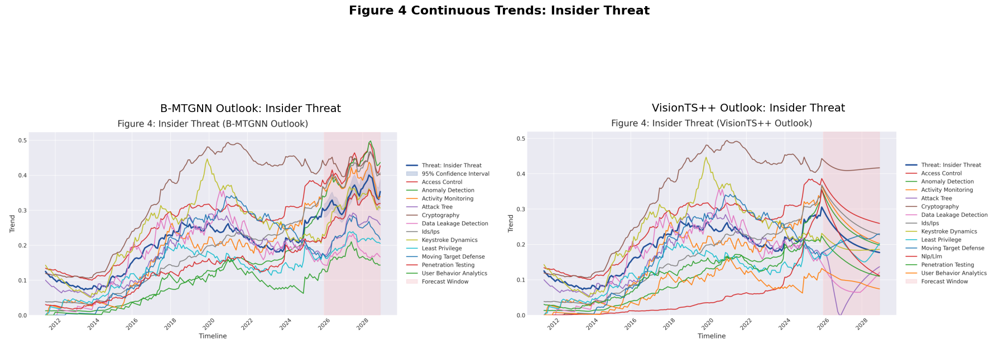

In [19]:
# Primary target threats for Figure 4 comparative outlook
fig4_threats = [
    "Malware",
    "Ransomware",
    "Ddos",
    "Adversarial_Attack",
    "Vulnerability",
    "Phishing",
    "Botnet",
    "Insider_Threat",
]

print(
    "--- Rendering Figure 4 Continuous Trend Outlook (Alpha = 0.05 Baseline) ---"
)

for threat in fig4_threats:
    bmtgnn_fig4_path = BMTGNN_OUTLOOK_DIR / f"Fig4_B-MTGNN_{threat}.png"
    vision_fig4_path = VISION_OUTLOOK_DIR / f"Fig4_VisionTS++_{threat}.png"

    display_name = threat.replace("_", " ")

    display_side_by_side(
        img_path_left=str(bmtgnn_fig4_path),
        img_path_right=str(vision_fig4_path),
        title_left=f"B-MTGNN Outlook: {display_name}",
        title_right=f"VisionTS++ Outlook: {display_name}",
        main_title=f"Figure 4 Continuous Trends: {display_name}",
    )